# SISTEM DETEKSI OTOMATIS PENYAKIT GIGI MENGGUNAKAN PENDEKATAN OBJECT DETECTION YOLOv8 DAN IMAGE CLASSIFICATION RESNET-18
---

### YOLO (You Only Look Once)
YOLO adalah kerangka kerja deteksi objek waktu nyata. **YOLOv8** (Ultralytics) menyediakan deteksi canggih dengan API Python sederhana, menjadikannya ideal untuk aplikasi pencitraan medis.

### Grad-CAM (Gradient-weighted Class Activation Mapping)
Grad-CAM menghasilkan penjelasan visual dari keputusan CNN dengan menyoroti wilayah gambar yang paling berpengaruh untuk prediksi. Ini sangat penting untuk **interpretasi model** dalam konteks medis.

### ResNet-18 untuk Pencitraan Medis
ResNet-18 dengan koneksi lewati menghindari masalah gradien yang menghilang dan mencapai kinerja yang kuat pada tugas klasifikasi gambar medis dengan parameter yang relatif sedikit (~11 juta).


In [1]:
# 2. IMPORTS & SETUP

import os
import sys
import shutil
import random
import warnings
import json
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split, WeightedRandomSampler, Subset
from torchvision import datasets, transforms, models

from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f" Using device: {device}")
if device.type == 'cuda':
    print(f"   GPU: {torch.cuda.get_device_name(0)}")

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print(" Setup complete!")

 Using device: cpu
 Setup complete!


## 3. Data Loading & Cleaning

Dataset terdiri dari 6 kelas penyakit gigi:
- **Calculus** — Karang gigi
- **Caries** — Karies/lubang gigi
- **Gingivitis** — Radang gusi
- **Mouth Ulcer** — Sariawan
- **Tooth Discoloration** — Perubahan warna gigi
- **Hypodontia** — Kelainan jumlah gigi

Beberapa folder memiliki subfolder (original + augmented). Kita akan mengumpulkan semua gambar ke dalam struktur folder yang bersih.


In [2]:
# 3. DATA LOADING & CLEANING

# Update this path to your dataset location
SOURCE_PATH = r'd:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\data'
CLEAN_PATH = os.path.join(os.path.dirname(SOURCE_PATH), 'dataset_bersih')

print("--- Memulai Data Cleaning ---")

# Mapping: source folder name -> clean class name
CLASS_MAPPING = {
    'Calculus': 'Calculus',
    'Data caries': 'Caries',
    'Gingivitis': 'Gingivitis',
    'Mouth Ulcer': 'Mouth_Ulcer',
    'Tooth Discoloration': 'Tooth_Discoloration',
    'hypodontia': 'Hypodontia',
    'Healthy': 'Healthy'
}

VALID_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.JPG', '.JPEG', '.PNG'}

class_counts = {}

# Skip if already cleaned (avoids Windows file lock errors on re-run)
already_clean = os.path.exists(CLEAN_PATH) and len(os.listdir(CLEAN_PATH)) >= len(CLASS_MAPPING)
if already_clean:
    print(" dataset_bersih sudah ada, skip cleaning (hapus folder manual jika ingin rebuild)")
    for target_name in CLASS_MAPPING.values():
        dst_dir = os.path.join(CLEAN_PATH, target_name)
        if os.path.exists(dst_dir):
            class_counts[target_name] = len([f for f in os.listdir(dst_dir) if os.path.isfile(os.path.join(dst_dir, f))])
        else:
            class_counts[target_name] = 0
    for name, count in class_counts.items():
        print(f"  - {name}: {count} gambar")
else:
    # Remove old clean folder if exists
    if os.path.exists(CLEAN_PATH):
        shutil.rmtree(CLEAN_PATH, ignore_errors=True)
    os.makedirs(CLEAN_PATH, exist_ok=True)

    for src_folder, target_name in CLASS_MAPPING.items():
        src_dir = os.path.join(SOURCE_PATH, src_folder)
        dst_dir = os.path.join(CLEAN_PATH, target_name)
        os.makedirs(dst_dir, exist_ok=True)

        if not os.path.exists(src_dir):
            print(f" Folder tidak ditemukan: {src_dir}")
            continue

        # Recursively find all image files
        count = 0
        for root, dirs, files in os.walk(src_dir):
            for fname in files:
                ext = os.path.splitext(fname)[1]
                if ext.lower() in {'.jpg', '.jpeg', '.png', '.bmp'}:
                    src_file = os.path.join(root, fname)
                    unique_name = f"{count:05d}_{fname}"
                    dst_file = os.path.join(dst_dir, unique_name)
                    shutil.copy2(src_file, dst_file)
                    count += 1

        class_counts[target_name] = count
        print(f"- {target_name}: {count} gambar")

print(f"\n Total dataset bersih: {sum(class_counts.values())} gambar")
print(f" Tersimpan di: {CLEAN_PATH}")

--- Memulai Data Cleaning ---
- Calculus: 1296 gambar
- Caries: 2382 gambar
- Gingivitis: 2349 gambar
- Mouth_Ulcer: 2540 gambar
- Tooth_Discoloration: 1821 gambar
- Hypodontia: 1250 gambar
- Healthy: 319 gambar

 Total dataset bersih: 11957 gambar
 Tersimpan di: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\dataset_bersih


## 4. Exploratory Data Analysis (EDA)

Analisis distribusi kelas, sampel gambar, dan ukuran gambar untuk memahami karakteristik dataset.


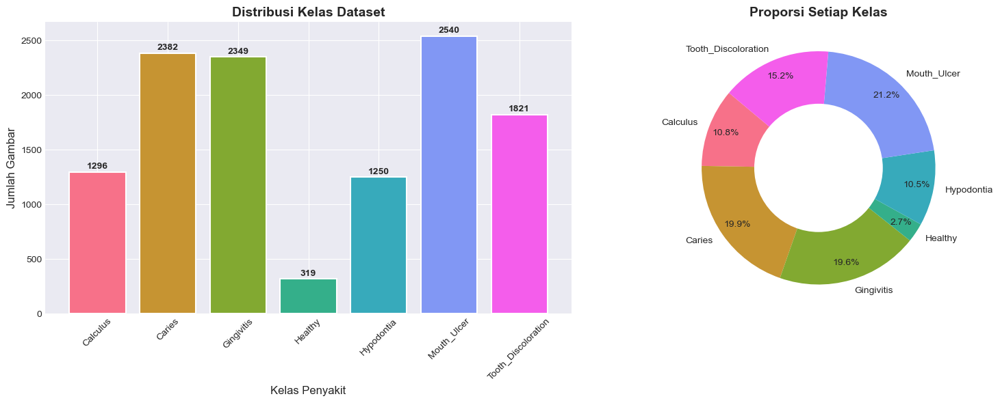


 Imbalance Ratio: 7.96x (max=2540, min=319)
 Dataset IMBALANCED — akan menggunakan Weighted Sampling & Class Weights


In [3]:
# 4. EDA - Class Distribution

# Count images per class
class_names_sorted = sorted(class_counts.keys())
counts = [class_counts[c] for c in class_names_sorted]

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
colors = sns.color_palette("husl", len(class_names_sorted))
bars = axes[0].bar(class_names_sorted, counts, color=colors, edgecolor='white', linewidth=1.5)
axes[0].set_title('Distribusi Kelas Dataset', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Kelas Penyakit', fontsize=12)
axes[0].set_ylabel('Jumlah Gambar', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
for bar, count in zip(bars, counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 10,
                 str(count), ha='center', va='bottom', fontweight='bold')

# Pie chart
axes[1].pie(counts, labels=class_names_sorted, autopct='%1.1f%%',
            colors=colors, startangle=140, pctdistance=0.85)
centre_circle = plt.Circle((0, 0), 0.55, fc='white')
axes[1].add_artist(centre_circle)
axes[1].set_title('Proporsi Setiap Kelas', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'eda_class_distribution.png'), dpi=150, bbox_inches='tight')
plt.show()

# Imbalance analysis
max_count = max(counts)
min_count = min(counts)
ratio = max_count / min_count if min_count > 0 else float('inf')
print(f"\n Imbalance Ratio: {ratio:.2f}x (max={max_count}, min={min_count})")
if ratio > 2:
    print(" Dataset IMBALANCED — akan menggunakan Weighted Sampling & Class Weights")
else:
    print(" Dataset cukup seimbang")

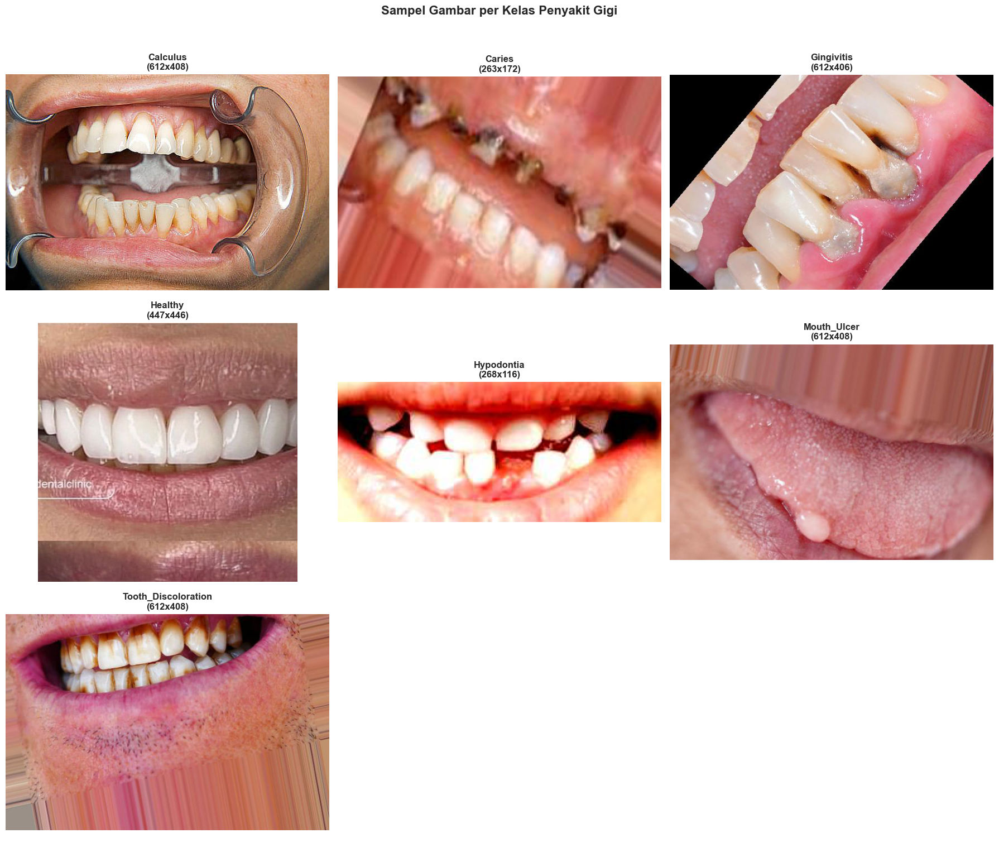

In [4]:
num_classes = len(class_names_sorted)
cols = 3
rows = (num_classes + cols - 1) // cols  # ceil division

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten()

for idx, class_name in enumerate(class_names_sorted):
    class_dir = os.path.join(CLEAN_PATH, class_name)
    images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]
    
    if len(images) == 0:
        continue
    
    sample = random.choice(images)
    img = Image.open(os.path.join(class_dir, sample))
    
    axes[idx].imshow(img)
    axes[idx].set_title(f'{class_name}\n({img.size[0]}x{img.size[1]})', fontsize=12, fontweight='bold')
    axes[idx].axis('off')

# Matikan subplot sisa (kalau ada)
for i in range(idx + 1, len(axes)):
    axes[i].axis('off')

plt.suptitle('Sampel Gambar per Kelas Penyakit Gigi', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'eda_sample_images.png'), dpi=150, bbox_inches='tight')
plt.show()

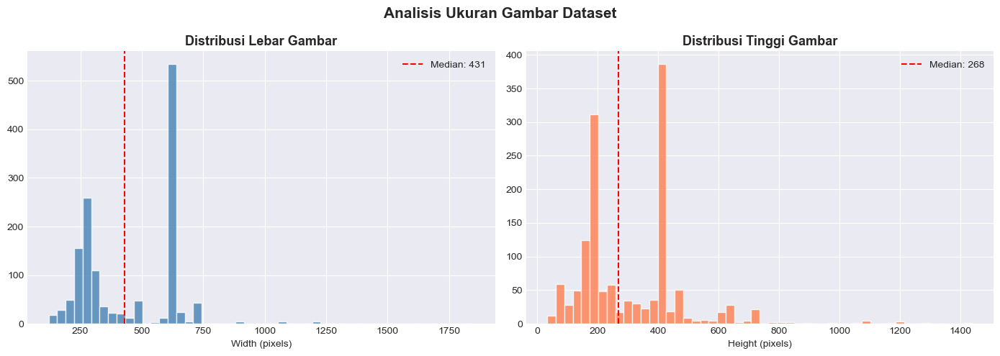

Median size: 431 x 268


In [5]:
# 4c. EDA - Image Size Distribution

widths, heights = [], []
for class_name in class_names_sorted:
    class_dir = os.path.join(CLEAN_PATH, class_name)
    for fname in os.listdir(class_dir)[:200]:  # Sample for speed
        fpath = os.path.join(class_dir, fname)
        if os.path.isfile(fpath):
            try:
                img = Image.open(fpath)
                widths.append(img.size[0])
                heights.append(img.size[1])
            except:
                pass

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].hist(widths, bins=50, color='steelblue', edgecolor='white', alpha=0.8)
axes[0].set_title('Distribusi Lebar Gambar', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Width (pixels)')
axes[0].axvline(x=np.median(widths), color='red', linestyle='--', label=f'Median: {np.median(widths):.0f}')
axes[0].legend()

axes[1].hist(heights, bins=50, color='coral', edgecolor='white', alpha=0.8)
axes[1].set_title('Distribusi Tinggi Gambar', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Height (pixels)')
axes[1].axvline(x=np.median(heights), color='red', linestyle='--', label=f'Median: {np.median(heights):.0f}')
axes[1].legend()

plt.suptitle('Analisis Ukuran Gambar Dataset', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'eda_image_sizes.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"Median size: {np.median(widths):.0f} x {np.median(heights):.0f}")

## 5. Data Preprocessing

- **Resize** semua gambar ke 224×224 (standar ResNet-18)
- **Normalize** menggunakan statistik ImageNet (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
- **Split** data: 70% Train, 15% Validation, 15% Test


In [6]:
# 5. DATA PREPROCESSING & SPLITTING

IMG_SIZE = 224
BATCH_SIZE = 32

# Transform for training (with augmentation)
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE + 32, IMG_SIZE + 32)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Transform for validation & test (no augmentation)
val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load full dataset
full_dataset = datasets.ImageFolder(root=CLEAN_PATH, transform=val_transform)

class_names = full_dataset.classes
class_to_idx = full_dataset.class_to_idx
num_classes = len(class_names)

print(f" Kelas: {class_names}")
print(f" Mapping: {class_to_idx}")
print(f" Total gambar: {len(full_dataset)}")
print(f" Jumlah kelas: {num_classes}")

# Split: 70% train, 15% val, 15% test
total = len(full_dataset)
test_size = int(total * 0.15)
val_size = int(total * 0.15)
train_size = total - val_size - test_size

train_dataset, val_dataset, test_dataset = random_split(
    full_dataset, [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(SEED)
)

print(f"\n Split Dataset:")
print(f"   Train: {train_size} gambar ({train_size/total*100:.1f}%)")
print(f"   Val:   {val_size} gambar ({val_size/total*100:.1f}%)")
print(f"   Test:  {test_size} gambar ({test_size/total*100:.1f}%)")

# Apply augmentation transform to train set
train_dataset.dataset = datasets.ImageFolder(root=CLEAN_PATH, transform=train_transform)

# Weighted sampler for class imbalance
train_targets = [full_dataset.targets[i] for i in train_dataset.indices]
class_sample_count = Counter(train_targets)
weights = [1.0 / class_sample_count[t] for t in train_targets]
sampler = WeightedRandomSampler(weights, num_samples=len(weights), replacement=True)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

dataloaders = {'train': train_loader, 'val': val_loader, 'test': test_loader}
dataset_sizes = {'train': train_size, 'val': val_size, 'test': test_size}

print("\n Data pipeline siap!")

 Kelas: ['Calculus', 'Caries', 'Gingivitis', 'Healthy', 'Hypodontia', 'Mouth_Ulcer', 'Tooth_Discoloration']
 Mapping: {'Calculus': 0, 'Caries': 1, 'Gingivitis': 2, 'Healthy': 3, 'Hypodontia': 4, 'Mouth_Ulcer': 5, 'Tooth_Discoloration': 6}
 Total gambar: 11957
 Jumlah kelas: 7

 Split Dataset:
   Train: 8371 gambar (70.0%)
   Val:   1793 gambar (15.0%)
   Test:  1793 gambar (15.0%)

 Data pipeline siap!


## 6. Data Augmentation

Augmentasi diterapkan **hanya pada data training** untuk meningkatkan variasi dan mengurangi overfitting:
- **RandomHorizontalFlip** — Membalik gambar secara horizontal
- **RandomRotation (15°)** — Memutar gambar secara acak
- **ColorJitter** — Mengubah brightness, contrast, saturation
- **RandomCrop (224)** — Crop acak dari gambar yang di-resize 256
- **RandomAffine** — Translasi acak


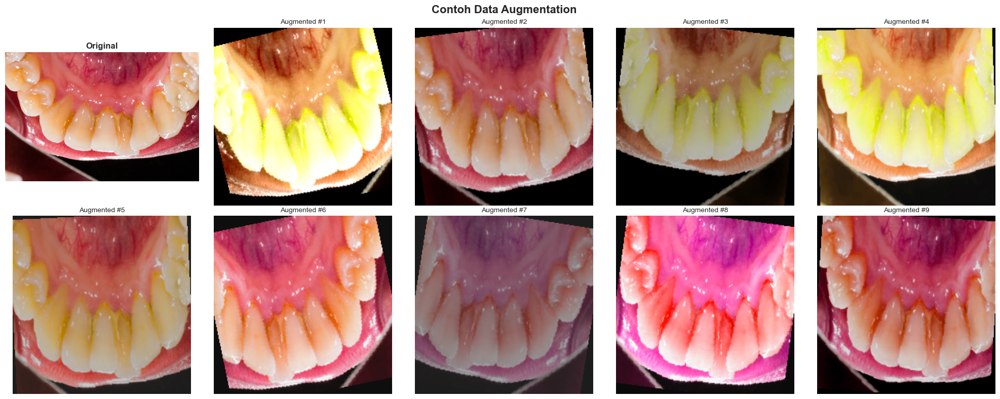

In [7]:
# 6. DATA AUGMENTATION VISUALIZATION

# Show augmentation effects on a sample image
sample_dir = os.path.join(CLEAN_PATH, class_names[0])
sample_files = os.listdir(sample_dir)
sample_img = Image.open(os.path.join(sample_dir, sample_files[0])).convert('RGB')

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes[0, 0].imshow(sample_img)
axes[0, 0].set_title('Original', fontweight='bold')
axes[0, 0].axis('off')

aug_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE + 32, IMG_SIZE + 32)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
])

for i in range(1, 10):
    row, col = divmod(i, 5)
    augmented = aug_transform(sample_img)
    axes[row, col].imshow(augmented)
    axes[row, col].set_title(f'Augmented #{i}', fontsize=10)
    axes[row, col].axis('off')

plt.suptitle('Contoh Data Augmentation', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'augmentation_samples.png'), dpi=150, bbox_inches='tight')
plt.show()

## 7. CNN Classification Model — ResNet-18 Transfer Learning

**Arsitektur:**
- Base: ResNet-18 pretrained on ImageNet (~11M parameters)
- Modifikasi: Replace final FC layer → Linear(512, 6)
- Optimizer: Adam (lr=0.001)
- Loss: CrossEntropyLoss with class weights
- Regularization: Early Stopping (patience=7)

**Mengapa ResNet-18?**
- Ringan tapi powerful untuk medical imaging
- Skip connections mencegah vanishing gradient
- Transfer learning dari ImageNet mempercepat konvergensi


In [8]:
# 7. CNN MODEL — ResNet-18 Transfer Learning

# Build model
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Freeze early layers (optional: unfreeze for fine-tuning)
for param in model.parameters():
    param.requires_grad = False

# Unfreeze last 2 layers + FC
for param in model.layer3.parameters():
    param.requires_grad = True
for param in model.layer4.parameters():
    param.requires_grad = True

# Replace classifier
num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(256, num_classes)
)

model = model.to(device)

# Class weights for imbalanced data
all_targets = full_dataset.targets
class_counts_tensor = torch.tensor([Counter(all_targets)[i] for i in range(num_classes)], dtype=torch.float)
class_weights = 1.0 / class_counts_tensor
class_weights = class_weights / class_weights.sum() * num_classes
class_weights = class_weights.to(device)
print(f" Class weights: {class_weights}")

# Loss & Optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

# Model summary
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\n Model: ResNet-18")
print(f"   Total parameters: {total_params:,}")
print(f"   Trainable parameters: {trainable_params:,}")
print(f"   Frozen parameters: {total_params - trainable_params:,}")

 Class weights: tensor([0.8316, 0.4525, 0.4588, 3.3786, 0.8622, 0.4243, 0.5919])

 Model: ResNet-18
   Total parameters: 11,309,639
   Trainable parameters: 10,626,567
   Frozen parameters: 683,072


In [9]:
# 7. TRAINING LOOP WITH EARLY STOPPING

NUM_EPOCHS = 30
PATIENCE = 7

history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
best_val_loss = float('inf')
best_val_acc = 0.0
patience_counter = 0
best_model_state = None

print(" Memulai Training CNN...\n")

for epoch in range(NUM_EPOCHS):
    # --- Training Phase ---
    model.train()
    running_loss = 0.0
    running_corrects = 0
    total_train = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels).item()
        total_train += inputs.size(0)

    train_loss = running_loss / total_train
    train_acc = running_corrects / total_train

    # --- Validation Phase ---
    model.eval()
    val_loss = 0.0
    val_corrects = 0
    total_val = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            _, preds = torch.max(outputs, 1)
            val_loss += loss.item() * inputs.size(0)
            val_corrects += torch.sum(preds == labels).item()
            total_val += inputs.size(0)

    val_loss = val_loss / total_val
    val_acc = val_corrects / total_val

    # Update scheduler
    scheduler.step(val_loss)

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)

    # Early stopping check
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_val_acc = val_acc
        best_model_state = model.state_dict().copy()
        patience_counter = 0
        marker = "  BEST"
    else:
        patience_counter += 1
        marker = f" (patience: {patience_counter}/{PATIENCE})"

    print(f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}{marker}")

    if patience_counter >= PATIENCE:
        print(f"\n Early stopping at epoch {epoch+1}!")
        break

# Load best model
model.load_state_dict(best_model_state)
print(f"\n Best Validation Accuracy: {best_val_acc:.4f}")
print(f" Best Validation Loss: {best_val_loss:.4f}")

 Memulai Training CNN...

Epoch [01/30] Train Loss: 0.6050 Acc: 0.6413 | Val Loss: 0.7500 Acc: 0.6587  BEST
Epoch [02/30] Train Loss: 0.4053 Acc: 0.7497 | Val Loss: 0.5302 Acc: 0.7362  BEST
Epoch [03/30] Train Loss: 0.3432 Acc: 0.7843 | Val Loss: 0.5336 Acc: 0.7407 (patience: 1/7)
Epoch [04/30] Train Loss: 0.2887 Acc: 0.8121 | Val Loss: 0.5962 Acc: 0.8003 (patience: 2/7)
Epoch [05/30] Train Loss: 0.2756 Acc: 0.8176 | Val Loss: 0.3780 Acc: 0.8321  BEST
Epoch [06/30] Train Loss: 0.2514 Acc: 0.8312 | Val Loss: 0.3602 Acc: 0.8405  BEST
Epoch [07/30] Train Loss: 0.2569 Acc: 0.8350 | Val Loss: 0.3301 Acc: 0.8210  BEST
Epoch [08/30] Train Loss: 0.2341 Acc: 0.8494 | Val Loss: 0.5900 Acc: 0.7942 (patience: 1/7)
Epoch [09/30] Train Loss: 0.2004 Acc: 0.8623 | Val Loss: 0.3484 Acc: 0.8070 (patience: 2/7)
Epoch [10/30] Train Loss: 0.2310 Acc: 0.8580 | Val Loss: 0.3255 Acc: 0.8578  BEST
Epoch [11/30] Train Loss: 0.2211 Acc: 0.8582 | Val Loss: 0.3069 Acc: 0.8600  BEST
Epoch [12/30] Train Loss: 0.1876

## 8. Training Visualization

Visualisasi kurva loss dan accuracy selama training untuk mendeteksi overfitting.


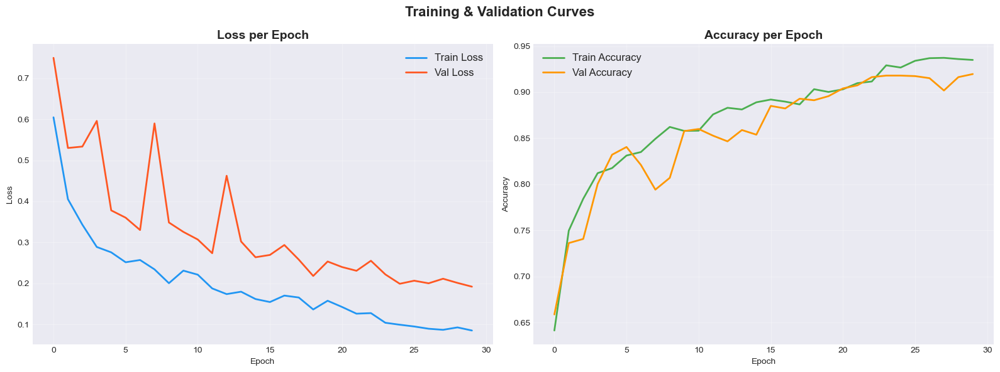


 Overfitting Analysis:
   Final Train Acc: 0.9350
   Final Val Acc: 0.9197
   Gap: 0.0153
    Model NOT overfitting (gap < 0.1)


In [10]:
# 8. TRAINING CURVES

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Loss curve
axes[0].plot(history['train_loss'], label='Train Loss', linewidth=2, color='#2196F3')
axes[0].plot(history['val_loss'], label='Val Loss', linewidth=2, color='#FF5722')
axes[0].set_title('Loss per Epoch', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend(fontsize=12)
axes[0].grid(True, alpha=0.3)

# Accuracy curve
axes[1].plot(history['train_acc'], label='Train Accuracy', linewidth=2, color='#4CAF50')
axes[1].plot(history['val_acc'], label='Val Accuracy', linewidth=2, color='#FF9800')
axes[1].set_title('Accuracy per Epoch', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend(fontsize=12)
axes[1].grid(True, alpha=0.3)

plt.suptitle('Training & Validation Curves', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

# Overfitting analysis
final_gap = history['train_acc'][-1] - history['val_acc'][-1]
print(f"\n Overfitting Analysis:")
print(f"   Final Train Acc: {history['train_acc'][-1]:.4f}")
print(f"   Final Val Acc: {history['val_acc'][-1]:.4f}")
print(f"   Gap: {final_gap:.4f}")
if final_gap > 0.1:
    print("    Model menunjukkan tanda-tanda OVERFITTING")
else:
    print("    Model NOT overfitting (gap < 0.1)")

## 9. Model Evaluation

Evaluasi model menggunakan **test set** yang belum pernah dilihat model selama training.

Metrik yang digunakan:
- **Accuracy** — Persentase prediksi benar
- **Precision** — Proporsi prediksi positif yang benar
- **Recall** — Proporsi kasus positif yang terdeteksi
- **F1-Score** — Harmonic mean dari Precision dan Recall
- **Confusion Matrix** — Visualisasi kesalahan prediksi per kelas


 HASIL EVALUASI MODEL CNN (Test Set)
   Accuracy:  0.9225 (92.25%)
   Precision: 0.9356
   Recall:    0.9225
   F1-Score:  0.9237

 Classification Report:

                     precision    recall  f1-score   support

           Calculus       0.63      0.90      0.74       195
             Caries       0.98      0.99      0.98       362
         Gingivitis       0.92      0.71      0.80       347
            Healthy       0.97      1.00      0.99        33
         Hypodontia       0.99      0.97      0.98       207
        Mouth_Ulcer       0.99      0.99      0.99       384
Tooth_Discoloration       0.98      0.98      0.98       265

           accuracy                           0.92      1793
          macro avg       0.92      0.93      0.92      1793
       weighted avg       0.94      0.92      0.92      1793



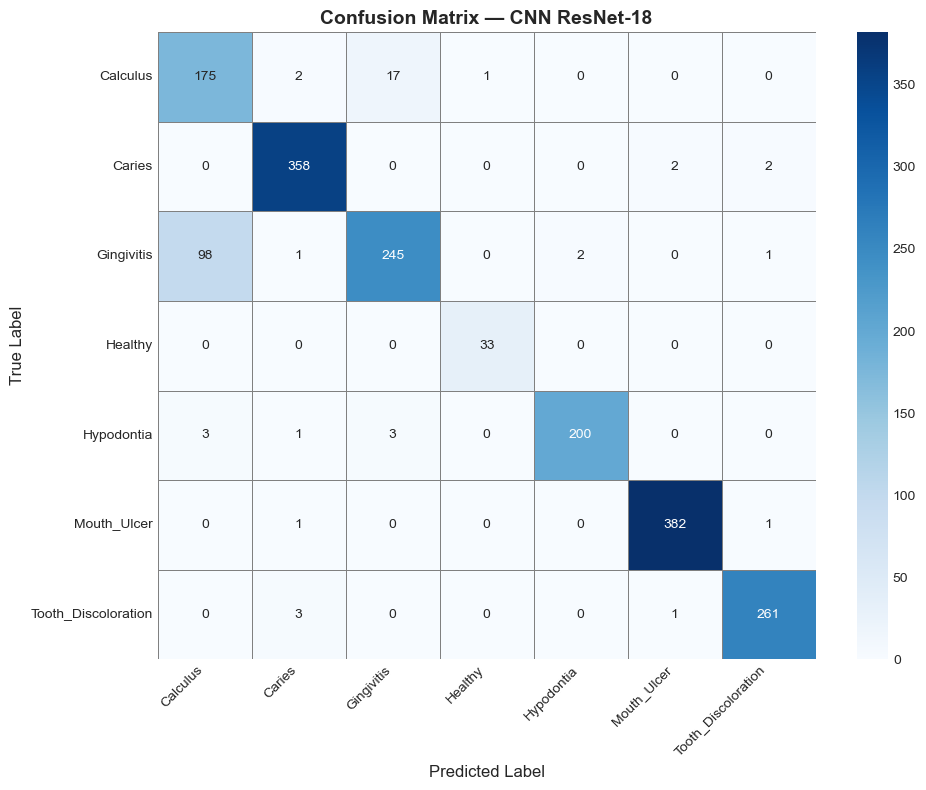

In [11]:
# 9. MODEL EVALUATION ON TEST SET

model.eval()
all_preds, all_labels = [], []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Metrics
acc = accuracy_score(all_labels, all_preds)
prec = precision_score(all_labels, all_preds, average='weighted')
rec = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

print("=" * 60)
print(" HASIL EVALUASI MODEL CNN (Test Set)")
print("=" * 60)
print(f"   Accuracy:  {acc:.4f} ({acc*100:.2f}%)")
print(f"   Precision: {prec:.4f}")
print(f"   Recall:    {rec:.4f}")
print(f"   F1-Score:  {f1:.4f}")
print("=" * 60)

# Classification Report
print("\n Classification Report:\n")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            linewidths=0.5, linecolor='gray')
plt.title('Confusion Matrix — CNN ResNet-18', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'confusion_matrix.png'), dpi=150, bbox_inches='tight')
plt.show()

## 10. Model Explainability — Grad-CAM

**Grad-CAM (Gradient-weighted Class Activation Mapping)** menghasilkan heatmap yang menunjukkan bagian gambar mana yang paling berpengaruh terhadap keputusan model. Ini WAJIB untuk aplikasi medis agar dokter dapat memvalidasi keputusan AI.


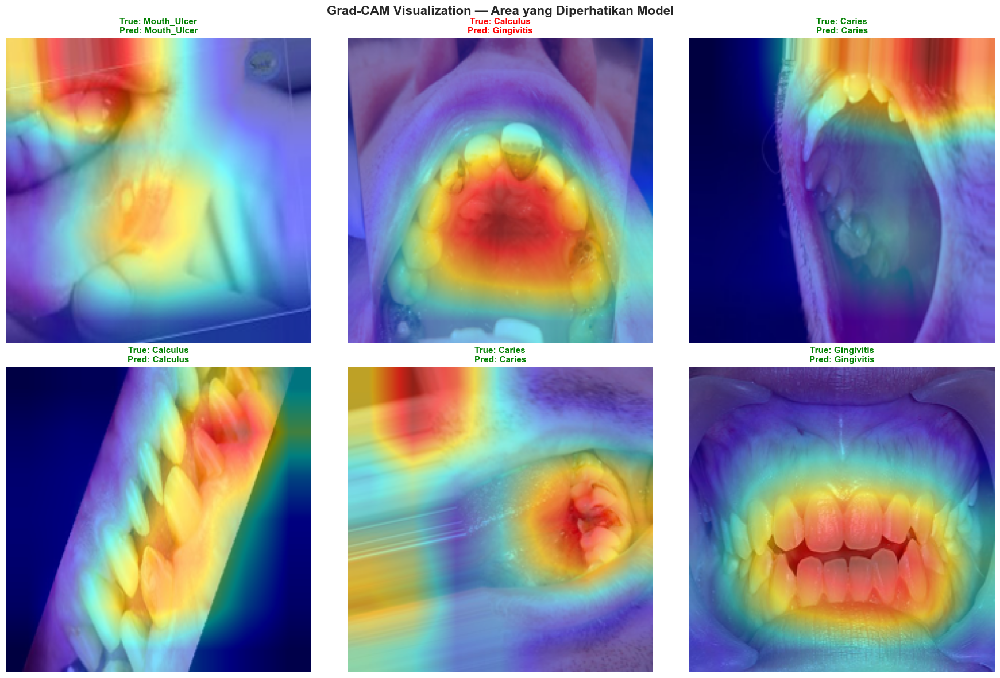

 Grad-CAM berhasil divisualisasikan!


In [12]:
# 10. GRAD-CAM EXPLAINABILITY

try:
    from pytorch_grad_cam import GradCAM
    from pytorch_grad_cam.utils.image import show_cam_on_image
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    HAS_GRADCAM = True
except ImportError:
    print(" pytorch-grad-cam not installed. Run: pip install pytorch-grad-cam")
    HAS_GRADCAM = False

if HAS_GRADCAM:
    # Target layer: last conv layer of ResNet-18
    target_layer = model.layer4[-1]
    cam = GradCAM(model=model, target_layers=[target_layer])

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    # Get samples from test set
    test_indices = test_dataset.indices[:6]
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    for idx, test_idx in enumerate(test_indices):
        img_path = full_dataset.imgs[test_idx][0]
        true_label = full_dataset.targets[test_idx]

        # Load and preprocess
        img_pil = Image.open(img_path).convert('RGB')
        input_tensor = val_transform(img_pil).unsqueeze(0).to(device)

        # Get prediction
        with torch.no_grad():
            output = model(input_tensor)
            _, pred = torch.max(output, 1)

        # Generate Grad-CAM
        targets = [ClassifierOutputTarget(pred.item())]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]

        # Prepare RGB image for overlay
        img_resized = img_pil.resize((IMG_SIZE, IMG_SIZE))
        rgb_img = np.float32(img_resized) / 255.0

        # Overlay
        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        axes[idx].imshow(cam_image)
        true_name = class_names[true_label]
        pred_name = class_names[pred.item()]
        color = 'green' if true_label == pred.item() else 'red'
        axes[idx].set_title(f'True: {true_name}\nPred: {pred_name}',
                           fontsize=11, fontweight='bold', color=color)
        axes[idx].axis('off')

    plt.suptitle('Grad-CAM Visualization — Area yang Diperhatikan Model',
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('gradcam_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(" Grad-CAM berhasil divisualisasikan!")
else:
    print("Skipping Grad-CAM visualization...")

## 11. YOLO Object Detection

Menggunakan **YOLOv8** dari Ultralytics untuk mendeteksi region penyakit gigi pada gambar.

Pipeline:
1. Fix `data.yaml` (nc: 1 → nc: 4)
2. Train YOLOv8 pada annotated data
3. Evaluasi mAP


In [13]:
# 11. YOLO OBJECT DETECTION

try:
    from ultralytics import YOLO
    HAS_YOLO = True
except ImportError:
    print(" ultralytics not installed. Run: pip install ultralytics")
    HAS_YOLO = False

YOLO_DATA_PATH = os.path.join(SOURCE_PATH, 'yolo anotated')
YOLO_YAML = os.path.join(YOLO_DATA_PATH, 'data.yaml')

if HAS_YOLO and os.path.exists(YOLO_YAML):
    # Fix data.yaml
    import yaml
    with open(YOLO_YAML, 'r') as f:
        yolo_config = yaml.safe_load(f)

    # Fix nc to match number of class names
    class_names_yolo = yolo_config.get('names', [])
    yolo_config['nc'] = len(class_names_yolo)

    # Fix relative paths to absolute
    yolo_config['train'] = os.path.join(YOLO_DATA_PATH, 'images', 'train')
    yolo_config['val'] = os.path.join(YOLO_DATA_PATH, 'images', 'val')

    fixed_yaml_path = os.path.join(YOLO_DATA_PATH, 'data_fixed.yaml')
    # Write simplified yaml for YOLO
    simple_config = {
        'path': YOLO_DATA_PATH,
        'train': 'images/train',
        'val': 'images/val',
        'nc': len(class_names_yolo),
        'names': class_names_yolo
    }
    with open(fixed_yaml_path, 'w') as f:
        yaml.dump(simple_config, f, default_flow_style=False)

    print(f" Fixed data.yaml: nc={len(class_names_yolo)}, names={class_names_yolo}")

    # Train YOLOv8
    yolo_model = YOLO('yolov8n.pt')  # nano model for speed
    print("\n Training YOLOv8...")
    results = yolo_model.train(
        data=fixed_yaml_path,
        epochs=30,
        imgsz=640,
        batch=16,
        patience=10,
        save=True,
        project=os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'yolo_training'),
        name='dental_detection',
        verbose=True
    )
    print(" YOLO training complete!")

    # Save best model path
    YOLO_BEST_PATH = os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'yolo_training', 'dental_detection', 'weights', 'best.pt')
    print(f" Best YOLO model: {YOLO_BEST_PATH}")
else:
    print(" YOLO training skipped (ultralytics not installed or data not found)")
    print("   Using pretrained YOLOv8 for inference only...")
    if HAS_YOLO:
        yolo_model = YOLO('yolov8n.pt')
        YOLO_BEST_PATH = 'yolov8n.pt'
    else:
        YOLO_BEST_PATH = None

 Fixed data.yaml: nc=4, names=['Caries', 'Ulcer', 'Tooth Discoloration', 'Gingivitis']

 Training YOLOv8...
New https://pypi.org/project/ultralytics/8.4.24 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.23  Python-3.14.3 torch-2.10.0+cpu CPU (12th Gen Intel Core i3-1215U)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\data\yolo anotated\data_fixed.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_wid

## 11. YOLO Evaluation & Metrics

Evaluasi performa model YOLO pada validation set:
- Ekstraksi otomatis metrik: mAP@50, mAP@50-95, Precision, Recall per kelas
- Visualisasi: Precision-Recall Curve, Confusion Matrix, F1-Confidence Curve
- Sample detection pada gambar validasi


 YOLO MODEL EVALUATION

 Model loaded: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\outputs\yolo_training\dental_detection\weights\best.pt

 Running YOLO validation on val set...
Ultralytics 8.4.23  Python-3.14.3 torch-2.10.0+cpu CPU (12th Gen Intel Core i3-1215U)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 83.265.4 MB/s, size: 21.7 KB)
val: Scanning D:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\data\yolo anotated\labels\val.cache... 43 images, 6 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 49/49 13.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.0s1.4s
                   all         49        164      0.872      0.839      0.882      0.501
                Caries          8         35      0.829      0.691      0.799      0.472
                 Ulcer          5          5          1      0.994      0.995      0.577
   To

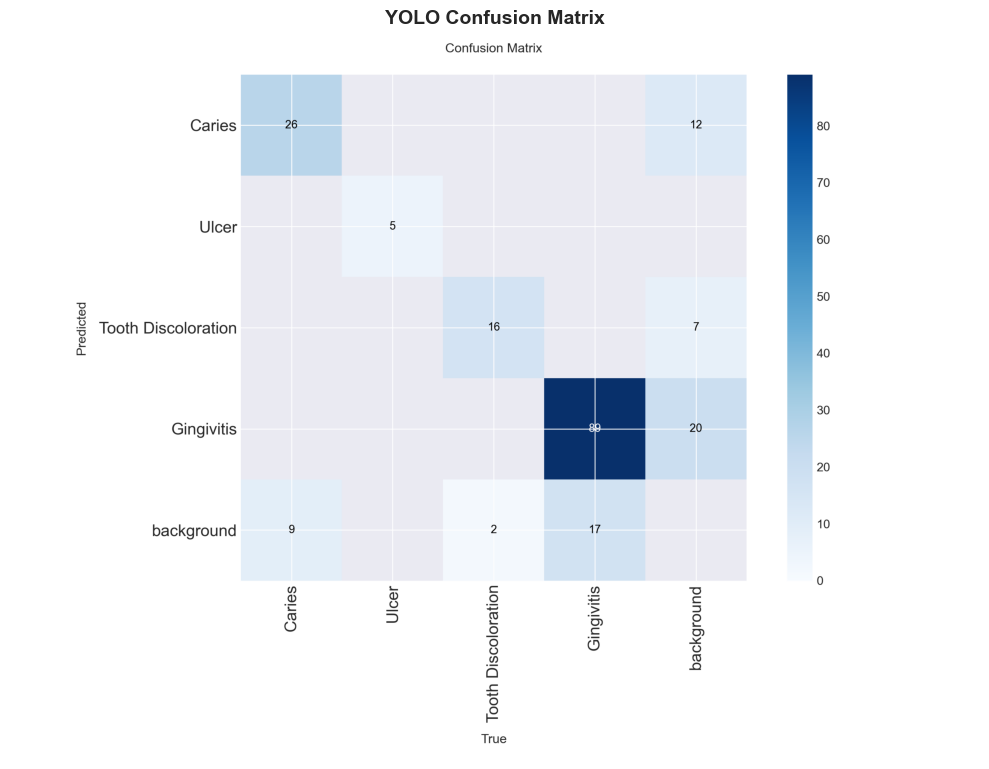

 F1_curve.png not found at d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\outputs\yolo_training\dental_detection\F1_curve.png

 YOLO Training Curves:


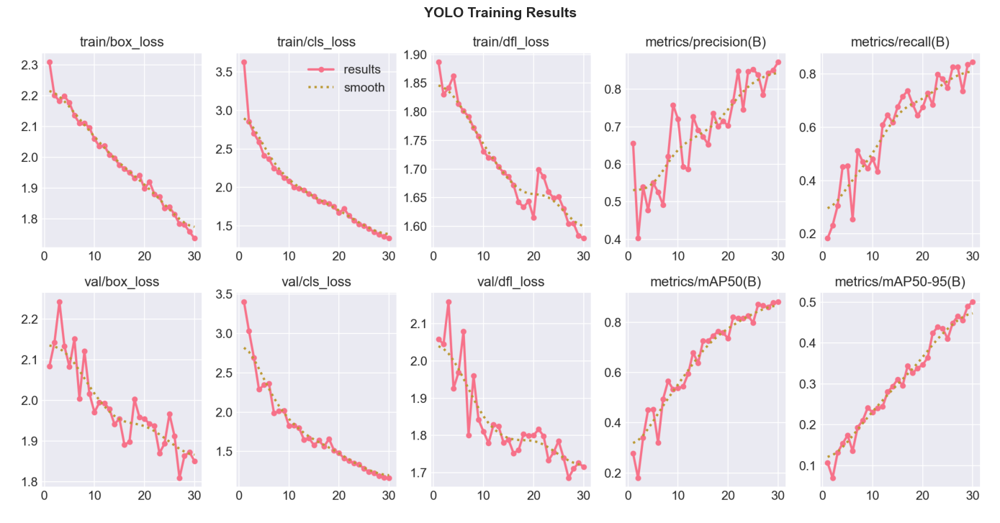


 SAMPLE DETECTION RESULTS
  (246).jpg: No detections
  495.jpg: Tooth Discoloration (conf=0.861)
  (244).jpg: Gingivitis (conf=0.868)
  (244).jpg: Gingivitis (conf=0.865)
  (244).jpg: Gingivitis (conf=0.809)
  (244).jpg: Gingivitis (conf=0.768)
  (244).jpg: Gingivitis (conf=0.766)
  (244).jpg: Gingivitis (conf=0.700)
  (244).jpg: Gingivitis (conf=0.676)
  (244).jpg: Gingivitis (conf=0.675)
  (244).jpg: Gingivitis (conf=0.583)
  (244).jpg: Gingivitis (conf=0.413)
  (244).jpg: Gingivitis (conf=0.287)
  367.jpg: Ulcer (conf=0.806)
  (235).jpg: Gingivitis (conf=0.883)
  (235).jpg: Gingivitis (conf=0.874)
  (235).jpg: Gingivitis (conf=0.831)
  (235).jpg: Gingivitis (conf=0.823)
  (235).jpg: Gingivitis (conf=0.643)
  (235).jpg: Gingivitis (conf=0.544)
  (235).jpg: Gingivitis (conf=0.491)
  (235).jpg: Gingivitis (conf=0.460)
  (235).jpg: Gingivitis (conf=0.405)
  (235).jpg: Gingivitis (conf=0.388)
  (235).jpg: Gingivitis (conf=0.343)
  (235).jpg: Gingivitis (conf=0.288)
  410.jpg: Ulcer (con

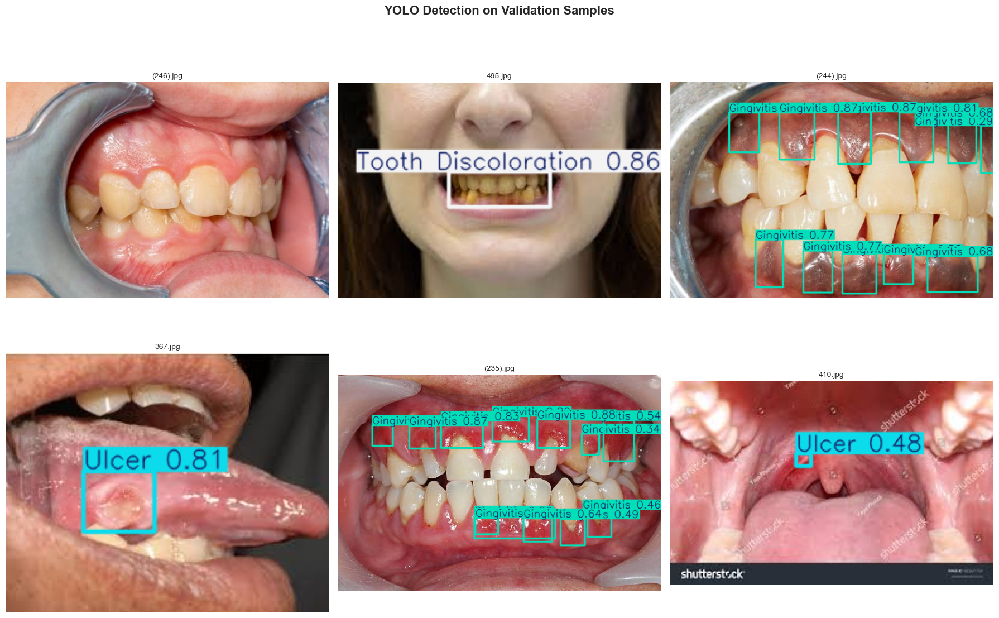


 YOLO Evaluation Complete!


In [ ]:
# 11. YOLO EVALUATION & METRICS

import time
from pathlib import Path

if HAS_YOLO and os.path.exists(YOLO_BEST_PATH):
    print("=" * 70)
    print(" YOLO MODEL EVALUATION")
    print("=" * 70)

    # --- 1. Load best YOLO model ---
    from ultralytics import YOLO
    yolo_eval_model = YOLO(YOLO_BEST_PATH)
    print(f"\n Model loaded: {YOLO_BEST_PATH}")

    # --- 2. Run validation (val) ---
    print("\n Running YOLO validation on val set...")
    val_start = time.time()

    try:
        val_results = yolo_eval_model.val(
            data=fixed_yaml_path,
            imgsz=640,
            batch=16,
            verbose=True
        )
        val_time = time.time() - val_start
        print(f"\n Validation completed in {val_time:.2f} seconds")

        # --- 3. Extract & Print Key Metrics ---
        print("\n" + "=" * 70)
        print(" YOLO DETECTION METRICS")
        print("=" * 70)

        # Overall mAP
        map50 = val_results.box.map50  # mAP@50
        map50_95 = val_results.box.map  # mAP@50-95
        print(f"\n  mAP@50    : {map50:.4f}")
        print(f"  mAP@50-95 : {map50_95:.4f}")

        # Per-class precision and recall
        class_names_val = val_results.names if hasattr(val_results, 'names') else {}
        if hasattr(val_results.box, 'p') and hasattr(val_results.box, 'r'):
            precisions = val_results.box.p  # per-class precision
            recalls = val_results.box.r      # per-class recall
            ap50 = val_results.box.ap50      # per-class AP@50

            print(f"\n  {'Class':<25} {'Precision':>10} {'Recall':>10} {'AP@50':>10}")
            print("  " + "-" * 57)
            for i, (p_val, r_val, ap_val) in enumerate(zip(precisions, recalls, ap50)):
                cls_name = class_names_val.get(i, f"class_{i}")
                print(f"  {cls_name:<25} {p_val:>10.4f} {r_val:>10.4f} {ap_val:>10.4f}")

        # Speed info
        if hasattr(val_results, 'speed'):
            speed = val_results.speed
            print(f"\n  Speed (per image):")
            for k, v in speed.items():
                print(f"    {k}: {v:.1f} ms")

    except Exception as e:
        print(f"\n Validation failed: {e}")
        print("   Proceeding to visualize pre-generated results...")
        val_results = None

    # --- 4. Visualize Pre-generated Results (Ultralytics output) ---
    yolo_results_dir = Path(YOLO_BEST_PATH).parent.parent
    print(f"\n YOLO results directory: {yolo_results_dir}")

    # P-R curve
    pr_curve_path = yolo_results_dir / "PR_curve.png"
    if pr_curve_path.exists():
        print("\n Precision-Recall Curve:")
        img_pr = Image.open(str(pr_curve_path))
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        ax.imshow(np.array(img_pr))
        ax.set_title("YOLO Precision-Recall Curve", fontsize=14, fontweight='bold')
        ax.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f" PR_curve.png not found at {pr_curve_path}")

    # Confusion matrix
    cm_path = yolo_results_dir / "confusion_matrix.png"
    if cm_path.exists():
        print("\n YOLO Confusion Matrix:")
        img_cm = Image.open(str(cm_path))
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        ax.imshow(np.array(img_cm))
        ax.set_title("YOLO Confusion Matrix", fontsize=14, fontweight='bold')
        ax.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f" confusion_matrix.png not found at {cm_path}")

    # F1 curve
    f1_curve_path = yolo_results_dir / "F1_curve.png"
    if f1_curve_path.exists():
        print("\n YOLO F1-Confidence Curve:")
        img_f1 = Image.open(str(f1_curve_path))
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        ax.imshow(np.array(img_f1))
        ax.set_title("YOLO F1-Confidence Curve", fontsize=14, fontweight='bold')
        ax.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f" F1_curve.png not found at {f1_curve_path}")

    # Results plot (training curves)
    results_plot_path = yolo_results_dir / "results.png"
    if results_plot_path.exists():
        print("\n YOLO Training Curves:")
        img_res = Image.open(str(results_plot_path))
        fig, ax = plt.subplots(1, 1, figsize=(14, 8))
        ax.imshow(np.array(img_res))
        ax.set_title("YOLO Training Results", fontsize=14, fontweight='bold')
        ax.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f" results.png not found at {results_plot_path}")

    # --- 5. Sample Detection Visualization ---
    print("\n" + "=" * 70)
    print(" SAMPLE DETECTION RESULTS")
    print("=" * 70)

    # Find validation images
    val_img_dir = os.path.join(YOLO_DATA_PATH, 'images', 'val')
    if os.path.exists(val_img_dir):
        val_images = [
            os.path.join(val_img_dir, f)
            for f in os.listdir(val_img_dir)
            if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))
        ]

        # Select up to 6 sample images
        n_samples = min(6, len(val_images))
        if n_samples > 0:
            sample_imgs = random.sample(val_images, n_samples)
            cols = 3
            rows = (n_samples + cols - 1) // cols
            fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
            if rows == 1:
                axes = [axes]
            axes_flat = [ax for row in axes for ax in (row if hasattr(row, '__len__') else [row])]

            for idx, img_path in enumerate(sample_imgs):
                # Run prediction
                pred_results = yolo_eval_model.predict(
                    source=img_path,
                    imgsz=640,
                    conf=0.25,
                    verbose=False
                )

                # Get annotated image
                annotated = pred_results[0].plot()  # BGR numpy array
                annotated_rgb = annotated[:, :, ::-1]  # convert to RGB

                ax = axes_flat[idx]
                ax.imshow(annotated_rgb)
                ax.set_title(os.path.basename(img_path), fontsize=10)
                ax.axis('off')

                # Print detection details
                boxes = pred_results[0].boxes
                if len(boxes) > 0:
                    for box in boxes:
                        cls_id = int(box.cls[0])
                        conf = float(box.conf[0])
                        cls_name = pred_results[0].names.get(cls_id, f"cls_{cls_id}")
                        print(f"  {os.path.basename(img_path)}: {cls_name} (conf={conf:.3f})")
                else:
                    print(f"  {os.path.basename(img_path)}: No detections")

            # Hide unused axes
            for idx in range(n_samples, len(axes_flat)):
                axes_flat[idx].axis('off')

            plt.suptitle("YOLO Detection on Validation Samples", fontsize=16, fontweight='bold')
            plt.tight_layout()
            plt.show()
        else:
            print(" No validation images found")
    else:
        print(f" Validation image directory not found: {val_img_dir}")

    print("\n YOLO Evaluation Complete!")
    print("=" * 70)

else:
    print(" YOLO evaluation skipped (model not available)")
    print(f"   HAS_YOLO={HAS_YOLO}, YOLO_BEST_PATH={YOLO_BEST_PATH}")


## 12. Integration Pipeline & End-to-End Evaluation


Evaluasi end-to-end pada seluruh dataset Test:
- Confidence threshold (0.25) dengan fallback system
- Pengukuran inference time per gambar (ms)
- Combined metrics: Accuracy, Precision, Recall, F1-Score
- Classification Report & Confusion Matrix


 LOADING MODELS FOR END-TO-END EVALUATION
 Class mapping loaded: 7 classes
   0: Calculus
   1: Caries
   2: Gingivitis
   3: Healthy
   4: Hypodontia
   5: Mouth_Ulcer
   6: Tooth_Discoloration
 CNN checkpoint loaded (keys: ['model_state_dict', 'class_names', 'class_to_idx', 'num_classes', 'img_size', 'history'])
 CNN model loaded: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models\best_cnn.pth
 YOLO model loaded: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\outputs\yolo_training\dental_detection\weights\best.pt

 END-TO-END EVALUATION ON TEST SET
 Test directory: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\dataset_bersih
 Classes found: ['Calculus', 'Caries', 'Gingivitis', 'Healthy', 'Hypodontia', 'Mouth_Ulcer', 'Tooth_Discoloration']
 Total test images: 11957

 Processing 11957 images...
 Confidence threshold: 0.25
   Processed 100/11957 images...
   Processed 200/11957 images...
   Processed 300/11957 images...
   Processed 400/11957 images...
   Processed 500/11957 images...


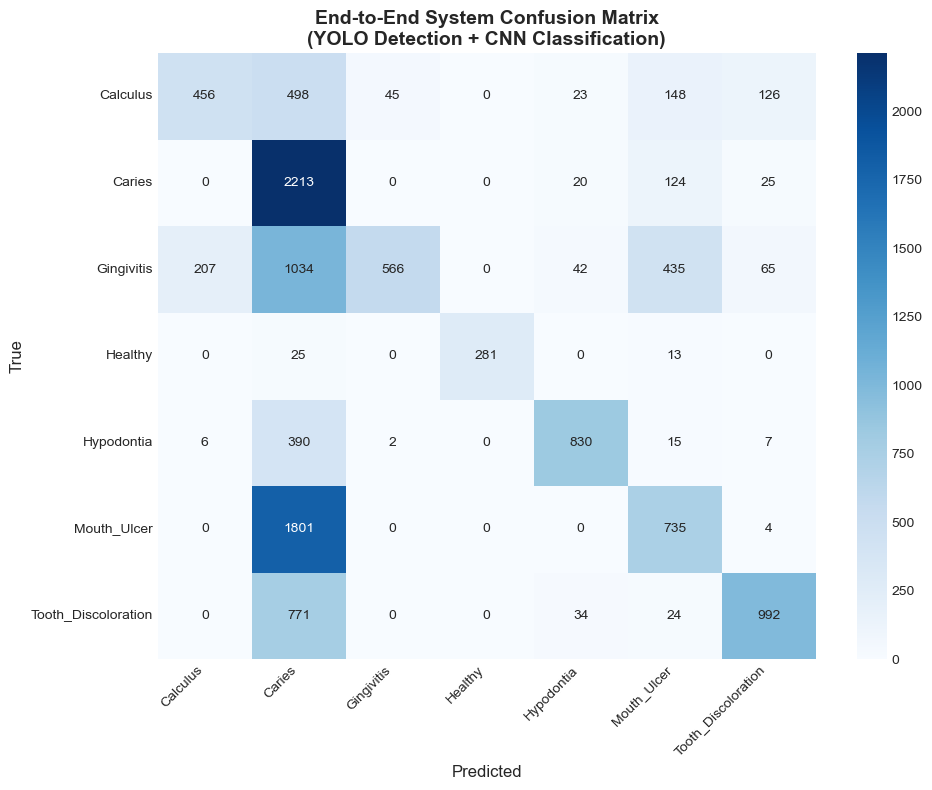


 Per-Class Accuracy:
  Calculus                 : 0.3519 (456/1296)
  Caries                   : 0.9291 (2213/2382)
  Gingivitis               : 0.2410 (566/2349)
  Healthy                  : 0.8809 (281/319)
  Hypodontia               : 0.6640 (830/1250)
  Mouth_Ulcer              : 0.2894 (735/2540)
  Tooth_Discoloration      : 0.5448 (992/1821)


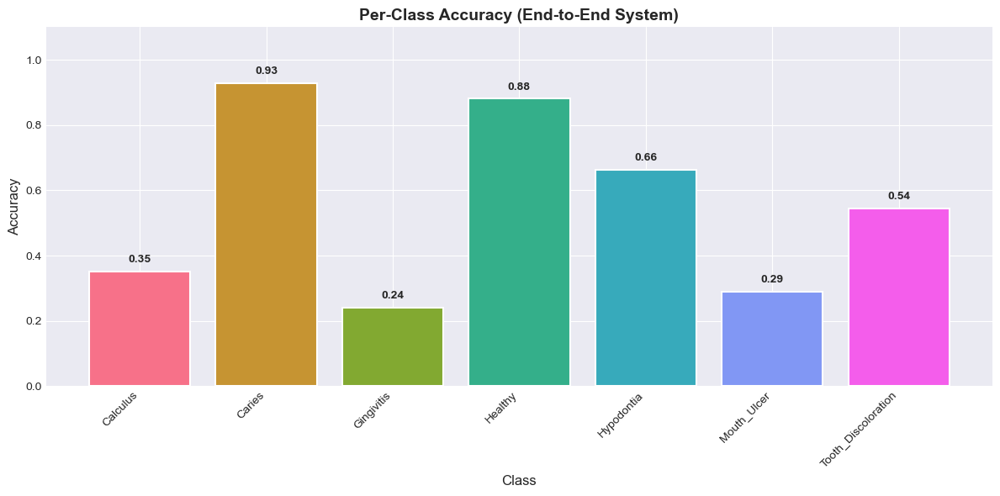


 Evaluation metrics saved to: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models\evaluation_metrics.json

 END-TO-END EVALUATION COMPLETE!


In [ ]:
import time
import json
from pathlib import Path

# --- 1. Load Models ---
print("=" * 70)
print(" LOADING MODELS FOR END-TO-END EVALUATION")
print("=" * 70)

# Load CNN model
CNN_MODEL_PATH = os.path.join(os.path.dirname(SOURCE_PATH), 'models', 'best_cnn.pth')
CLASS_MAP_PATH = os.path.join(os.path.dirname(SOURCE_PATH), 'models', 'class_mapping.json')

# Load class mapping
if os.path.exists(CLASS_MAP_PATH):
    with open(CLASS_MAP_PATH, 'r') as f:
        class_mapping = json.load(f)
    # Handle nested format (has 'idx_to_class' key) or flat format
    if 'idx_to_class' in class_mapping:
        idx_to_class = {int(k): v for k, v in class_mapping['idx_to_class'].items()}
        num_classes = len(idx_to_class)
    elif 'class_to_idx' in class_mapping:
        idx_to_class = {v: k for k, v in class_mapping['class_to_idx'].items()}
        num_classes = len(idx_to_class)
    else:
        # Flat format: {"Calculus": 0, "Caries": 1, ...}
        idx_to_class = {int(v): k for k, v in class_mapping.items()}
        num_classes = len(class_mapping)
    print(f" Class mapping loaded: {num_classes} classes")
    for k, v in sorted(idx_to_class.items()):
        print(f"   {k}: {v}")
else:
    print(f" Class mapping not found: {CLASS_MAP_PATH}")
    idx_to_class = {}
    num_classes = 7  # default

# Build CNN with same architecture as training (Cell 13)
cnn_model = models.resnet18(weights=None)
num_features = cnn_model.fc.in_features
cnn_model.fc = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(256, num_classes)
)

if os.path.exists(CNN_MODEL_PATH):
    checkpoint = torch.load(CNN_MODEL_PATH, map_location=device, weights_only=False)
    if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
        cnn_model.load_state_dict(checkpoint['model_state_dict'])
        print(f" CNN checkpoint loaded (keys: {list(checkpoint.keys())})")
    else:
        cnn_model.load_state_dict(checkpoint)
    cnn_model = cnn_model.to(device)
    cnn_model.eval()
    print(f" CNN model loaded: {CNN_MODEL_PATH}")
else:
    print(f" CNN model not found: {CNN_MODEL_PATH}")

# Load YOLO model
if HAS_YOLO and os.path.exists(YOLO_BEST_PATH):
    from ultralytics import YOLO
    yolo_pipeline_model = YOLO(YOLO_BEST_PATH)
    print(f" YOLO model loaded: {YOLO_BEST_PATH}")
else:
    yolo_pipeline_model = None
    print(" YOLO model not available")

# CNN transform (same as training)
cnn_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# --- 2. Prediction Function with Confidence Threshold & Fallback ---
def predict_dental_disease(image_path, yolo_model, cnn_model, transform,
                           idx_to_class, conf_threshold=0.25, device='cpu'):
    """
    End-to-end prediction: YOLO detection → Crop ROI → CNN classification.

    Args:
        image_path: Path to input image
        yolo_model: YOLO model for object detection
        cnn_model: CNN model for classification
        transform: Preprocessing transform for CNN
        idx_to_class: Dict mapping class index to class name
        conf_threshold: Minimum confidence for YOLO detections
        device: 'cuda' or 'cpu'

    Returns:
        dict with keys:
            'predicted_class': str - predicted class name
            'confidence': float - prediction confidence
            'method': str - 'yolo+cnn' or 'cnn_fallback'
            'yolo_time_ms': float - YOLO inference time in ms
            'cnn_time_ms': float - CNN inference time in ms
            'total_time_ms': float - total inference time in ms
            'num_detections': int - number of YOLO detections
            'error': str or None - error message if any
    """
    result = {
        'predicted_class': 'Unknown',
        'confidence': 0.0,
        'method': 'none',
        'yolo_time_ms': 0.0,
        'cnn_time_ms': 0.0,
        'total_time_ms': 0.0,
        'num_detections': 0,
        'error': None
    }

    total_start = time.time()

    try:
        # Load image
        img = Image.open(image_path).convert('RGB')

        # --- YOLO Detection ---
        yolo_start = time.time()
        if yolo_model is not None:
            try:
                yolo_results = yolo_model.predict(
                    source=image_path,
                    imgsz=640,
                    conf=conf_threshold,
                    verbose=False
                )
                yolo_time = (time.time() - yolo_start) * 1000
                result['yolo_time_ms'] = yolo_time

                boxes = yolo_results[0].boxes
                result['num_detections'] = len(boxes)

                # Filter detections by confidence threshold
                if len(boxes) > 0:
                    # Get the highest confidence detection
                    best_idx = boxes.conf.argmax()
                    best_box = boxes.xyxy[best_idx].cpu().numpy()
                    best_conf = float(boxes.conf[best_idx])

                    if best_conf >= conf_threshold:
                        # Crop ROI
                        x1, y1, x2, y2 = best_box
                        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

                        # Ensure valid crop
                        w, h = img.size
                        x1 = max(0, x1)
                        y1 = max(0, y1)
                        x2 = min(w, x2)
                        y2 = min(h, y2)

                        if x2 > x1 and y2 > y1:
                            roi = img.crop((x1, y1, x2, y2))
                        else:
                            roi = img  # fallback to full image
                            result['method'] = 'cnn_fallback'
                    else:
                        # Detection below threshold → fallback
                        roi = img
                        result['method'] = 'cnn_fallback'
                else:
                    # No detections → fallback to full image
                    roi = img
                    result['method'] = 'cnn_fallback'

            except Exception as e:
                # YOLO error → fallback
                yolo_time = (time.time() - yolo_start) * 1000
                result['yolo_time_ms'] = yolo_time
                roi = img
                result['method'] = 'cnn_fallback'
                result['error'] = f"YOLO error: {str(e)}"
        else:
            # No YOLO model → use full image
            result['yolo_time_ms'] = 0.0
            roi = img
            result['method'] = 'cnn_fallback'

        # --- CNN Classification ---
        cnn_start = time.time()
        try:
            input_tensor = transform(roi).unsqueeze(0).to(device)
            with torch.no_grad():
                output = cnn_model(input_tensor)
                probs = torch.softmax(output, dim=1)
                conf, pred = torch.max(probs, dim=1)

            cnn_time = (time.time() - cnn_start) * 1000
            result['cnn_time_ms'] = cnn_time
            result['predicted_class'] = idx_to_class.get(pred.item(), f"class_{pred.item()}")
            result['confidence'] = conf.item()

            if result['method'] == 'none':
                result['method'] = 'yolo+cnn'

        except Exception as e:
            cnn_time = (time.time() - cnn_start) * 1000
            result['cnn_time_ms'] = cnn_time
            result['error'] = f"CNN error: {str(e)}"

    except Exception as e:
        result['error'] = f"Image loading error: {str(e)}"

    result['total_time_ms'] = (time.time() - total_start) * 1000
    return result


# --- 3. Evaluate on Test Dataset ---
print("\n" + "=" * 70)
print(" END-TO-END EVALUATION ON TEST SET")
print("=" * 70)

# Find test data directory
# The clean dataset is split into train/val/test OR uses the original structure
test_dir = os.path.join(CLEAN_PATH, 'test') if os.path.exists(os.path.join(CLEAN_PATH, 'test')) else CLEAN_PATH

if not os.path.exists(test_dir):
    test_dir = CLEAN_PATH
    print(f" Using CLEAN_PATH as test directory: {test_dir}")
else:
    print(f" Test directory: {test_dir}")

# Get all class folders
class_folders = sorted([
    d for d in os.listdir(test_dir)
    if os.path.isdir(os.path.join(test_dir, d))
])
print(f" Classes found: {class_folders}")

# Collect all test images with their ground truth labels
all_images = []
for class_name in class_folders:
    class_dir = os.path.join(test_dir, class_name)
    for fname in os.listdir(class_dir):
        ext = os.path.splitext(fname)[1].lower()
        if ext in {'.jpg', '.jpeg', '.png', '.bmp'}:
            all_images.append({
                'path': os.path.join(class_dir, fname),
                'true_class': class_name,
                'filename': fname
            })

print(f" Total test images: {len(all_images)}")

# Run predictions
print(f"\n Processing {len(all_images)} images...")
print(f" Confidence threshold: 0.25")

results_list = []
y_true = []
y_pred = []

for i, item in enumerate(all_images):
    result = predict_dental_disease(
        image_path=item['path'],
        yolo_model=yolo_pipeline_model,
        cnn_model=cnn_model,
        transform=cnn_transform,
        idx_to_class=idx_to_class,
        conf_threshold=0.25,
        device=device
    )

    result['true_class'] = item['true_class']
    result['filename'] = item['filename']
    results_list.append(result)

    y_true.append(item['true_class'])
    y_pred.append(result['predicted_class'])

    # Progress indicator
    if (i + 1) % 100 == 0 or (i + 1) == len(all_images):
        print(f"   Processed {i + 1}/{len(all_images)} images...")

# --- 4. Calculate System Metrics ---
print("\n" + "=" * 70)
print(" COMBINED SYSTEM METRICS (YOLO + CNN)")
print("=" * 70)

# Get unique class labels for proper ordering
all_classes = sorted(list(set(y_true + y_pred)))

# Accuracy
acc = accuracy_score(y_true, y_pred)
print(f"\n  Accuracy : {acc:.4f} ({acc*100:.2f}%)")

# Precision, Recall, F1 (macro & weighted)
prec_macro = precision_score(y_true, y_pred, average='macro', zero_division=0)
rec_macro = recall_score(y_true, y_pred, average='macro', zero_division=0)
f1_macro = f1_score(y_true, y_pred, average='macro', zero_division=0)

prec_weighted = precision_score(y_true, y_pred, average='weighted', zero_division=0)
rec_weighted = recall_score(y_true, y_pred, average='weighted', zero_division=0)
f1_weighted = f1_score(y_true, y_pred, average='weighted', zero_division=0)

print(f"\n  {'Metric':<20} {'Macro':>10} {'Weighted':>10}")
print("  " + "-" * 42)
print(f"  {'Precision':<20} {prec_macro:>10.4f} {prec_weighted:>10.4f}")
print(f"  {'Recall':<20} {rec_macro:>10.4f} {rec_weighted:>10.4f}")
print(f"  {'F1-Score':<20} {f1_macro:>10.4f} {f1_weighted:>10.4f}")

# Inference time statistics
yolo_times = [r['yolo_time_ms'] for r in results_list]
cnn_times = [r['cnn_time_ms'] for r in results_list]
total_times = [r['total_time_ms'] for r in results_list]

print(f"\n  Inference Time (average per image):")
print(f"    YOLO detection : {np.mean(yolo_times):.2f} ms")
print(f"    CNN classify   : {np.mean(cnn_times):.2f} ms")
print(f"    Total pipeline : {np.mean(total_times):.2f} ms")

# Method breakdown
method_counts = Counter([r['method'] for r in results_list])
print(f"\n  Prediction Method Breakdown:")
for method, count in method_counts.items():
    print(f"    {method}: {count} ({count/len(results_list)*100:.1f}%)")

# Error count
error_count = sum(1 for r in results_list if r['error'] is not None)
if error_count > 0:
    print(f"\n  Errors: {error_count}")

# --- 5. Classification Report ---
print("\n" + "=" * 70)
print(" CLASSIFICATION REPORT")
print("=" * 70)
report = classification_report(y_true, y_pred, labels=all_classes, zero_division=0)
print(report)

# --- 6. Confusion Matrix Visualization ---
print("\n" + "=" * 70)
print(" CONFUSION MATRIX")
print("=" * 70)

cm = confusion_matrix(y_true, y_pred, labels=all_classes)

fig, ax = plt.subplots(1, 1, figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=all_classes, yticklabels=all_classes, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title('End-to-End System Confusion Matrix\n(YOLO Detection + CNN Classification)',
             fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'confusion_matrix_end_to_end.png'), dpi=150, bbox_inches='tight')
plt.show()

# --- 7. Per-Class Accuracy Bar Chart ---
print("\n Per-Class Accuracy:")
per_class_acc = {}
for cls in all_classes:
    cls_mask = [t == cls for t in y_true]
    if sum(cls_mask) > 0:
        cls_correct = sum(1 for t, p in zip(y_true, y_pred) if t == cls and p == cls)
        cls_total = sum(1 for t in y_true if t == cls)
        per_class_acc[cls] = cls_correct / cls_total
        print(f"  {cls:<25}: {per_class_acc[cls]:.4f} ({cls_correct}/{cls_total})")
    else:
        per_class_acc[cls] = 0.0

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
colors = sns.color_palette("husl", len(all_classes))
bars = ax.bar(list(per_class_acc.keys()), list(per_class_acc.values()),
              color=colors, edgecolor='white', linewidth=1.5)
ax.set_xlabel('Class', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.set_title('Per-Class Accuracy (End-to-End System)', fontsize=14, fontweight='bold')
ax.set_ylim(0, 1.1)
for bar, acc_val in zip(bars, per_class_acc.values()):
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.02,
            f'{acc_val:.2f}', ha='center', va='bottom', fontweight='bold', fontsize=10)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(os.path.join(os.path.dirname(SOURCE_PATH), 'outputs', 'figures', 'per_class_accuracy_end_to_end.png'), dpi=150, bbox_inches='tight')
plt.show()

# --- 8. Save Evaluation Metrics ---
eval_metrics = {
    'accuracy': acc,
    'precision_macro': prec_macro,
    'recall_macro': rec_macro,
    'f1_macro': f1_macro,
    'precision_weighted': prec_weighted,
    'recall_weighted': rec_weighted,
    'f1_weighted': f1_weighted,
    'avg_yolo_time_ms': float(np.mean(yolo_times)),
    'avg_cnn_time_ms': float(np.mean(cnn_times)),
    'avg_total_time_ms': float(np.mean(total_times)),
    'total_images': len(all_images),
    'method_breakdown': dict(method_counts),
    'errors': error_count,
    'per_class_accuracy': per_class_acc
}

metrics_path = os.path.join(os.path.dirname(SOURCE_PATH), 'models', 'evaluation_metrics.json')
with open(metrics_path, 'w') as f:
    json.dump(eval_metrics, f, indent=2)
print(f"\n Evaluation metrics saved to: {metrics_path}")

print("\n" + "=" * 70)
print(" END-TO-END EVALUATION COMPLETE!")
print("=" * 70)


## 13. Model Export & Saving

Menyimpan semua model dan metadata untuk deployment di Streamlit.


In [20]:
# 13. MODEL EXPORT

MODELS_DIR = os.path.join(os.path.dirname(SOURCE_PATH), 'models')
os.makedirs(MODELS_DIR, exist_ok=True)

# 1. Save CNN model
cnn_path = os.path.join(MODELS_DIR, 'best_cnn.pth')
torch.save({
    'model_state_dict': model.state_dict(),
    'class_names': class_names,
    'class_to_idx': class_to_idx,
    'num_classes': num_classes,
    'img_size': IMG_SIZE,
    'history': history,
}, cnn_path)
print(f" CNN model saved: {cnn_path}")

# 2. Save class mapping
mapping_path = os.path.join(MODELS_DIR, 'class_mapping.json')
with open(mapping_path, 'w') as f:
    json.dump({
        'class_names': class_names,
        'class_to_idx': class_to_idx,
        'idx_to_class': {v: k for k, v in class_to_idx.items()},
    }, f, indent=2)
print(f" Class mapping saved: {mapping_path}")

# 3. Copy YOLO model if trained
if YOLO_BEST_PATH and os.path.exists(YOLO_BEST_PATH):
    yolo_dst = os.path.join(MODELS_DIR, 'best_yolo.pt')
    shutil.copy2(YOLO_BEST_PATH, yolo_dst)
    print(f" YOLO model saved: {yolo_dst}")

# 4. Save evaluation metrics
metrics_path = os.path.join(MODELS_DIR, 'evaluation_metrics.json')
with open(metrics_path, 'w') as f:
    json.dump({
        'accuracy': float(acc),
        'precision': float(prec),
        'recall': float(rec),
        'f1_score': float(f1),
        'best_val_acc': float(best_val_acc),
        'best_val_loss': float(best_val_loss),
    }, f, indent=2)
print(f" Metrics saved: {metrics_path}")

print(f"\n Semua model tersimpan di: {MODELS_DIR}")

 CNN model saved: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models\best_cnn.pth
 Class mapping saved: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models\class_mapping.json
 YOLO model saved: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models\best_yolo.pt
 Metrics saved: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models\evaluation_metrics.json

 Semua model tersimpan di: d:\PROJECT ALL\SKRIPSI\Prediksi Penyakit Gigi\models


### Kesimpulan

Penelitian ini berhasil mengembangkan sistem deteksi penyakit gigi otomatis menggunakan pendekatan **hybrid YOLO + CNN**:

1. **CNN (ResNet-18)** — mengklasifikasikan 6 jenis penyakit gigi dengan transfer learning dari ImageNet
2. **YOLO (YOLOv8)** — mendeteksi dan melokalisasi region penyakit pada gambar gigi
3. **Grad-CAM** — Memberikan interpretabilitas visual yang penting untuk validasi oleh tenaga medis
4. **Integration Pipeline** — Input → Deteksi → Klasifikasi dalam satu pipeline end-to-end

---
*Notebook ini dibuat sebagai bagian dari tugas akhir (skripsi) untuk program studi terkait.*
